# Final Workflow StatsLab

### Contents:
* [0. Overview](#overview)
    * [Our Objective](#objective)
    * [Gaussian Processes and Implementation](#gaussian-processes)
    * [Model Inputs and Outputs](#mod-in-out)
    * [Using This File to Identify Hotspots](#hotspots)
* [1. Helper Functions](#helpers)
* [2. Plots](#plots)
* [3. Workflow Illustration](#workflow)
    * [3.0 Preprocessing Data](#prepro)
    * [3.1 Fitting the Model from Scratch](#scratch)
    * [3.2 Plotting Previous Results](#plot-previous)
    * [3.3 Comparing Models in Different Time Brackets](#time-comparison)

## 0. Overview <a class="anchor" id="overview"></a>

### Objective: Determine Whether PM2.5 Hotspots are Genuine <a class="anchor" id="objective"></a>

Our main objective is to devise a method for assessing the confidence that an _identified_ hotspot is a _genuine_ hotspot, in the context of PM2.5 air pollution. We use data collected in Kigali, Rwanda, in September 2021. The team at Open Seneca fitted sensors to the bikes of twenty local delivery drivers, and gathered data about the ambient PM2.5 pollution they encountered over the course of the month. Keep in mind, though, that the _method_ we devise to identify genuine hotspots is more relevant than the genuine hotspots we identify in Kigali. We intend that the method be applicable to Open Seneca’s PM2.5 data from other cities.

The ‘hotspots’ are neighborhoods more polluted than some baseline level in the surrounding city. Just looking at the locations with the highest pollution measurements does not immediately reveal all hotspots. Pollution follows several temporal patterns, so one must adjust for the time at which measurements are made. Measurements are also geographically sparse; in a short time frame, the delivery drivers will only travel on so many roads. In order to make city-wide pollution comparisons, one must therefore leverage the available data to make predictions about the un-measured neighborhoods.

We propose adjusting for the temporal pattern by de-trending the data. Three baselines are computed: a 15-minute baseline, a daily baseline, and a baseline combining these two. A baseline is the rolling average of all measurements in the given time period. According to the number of active measurement devices and the dynamics of pollution in the city, an analyst can choose which of these baselines is most appropriate - and subtract it from the measurements to de-trend them.

Then we fit a Gaussian Process model, with PM2.5 pollution as the dependent variable and latitude & longitude as the independent variables. The idea is that we estimate a flexible regression surface across the whole city of Kigali for the mean pollution level in each spot. Equipped with a prior distribution, the Gaussian Process model allows for the construction of confidence intervals, and thus the assessment of how likely it is that any point in the city is a genuine hotspot. 

_Please consult the Gaussian Processes handout for technical details!_


### Using Gaussian Process Regression to Identify Air Pollution Hotspots <a class="anchor" id="gaussian-processes"></a>

To use gaussian process regression to identify airquality hotspots specifically, we have to overcome a few problems
- Number of observations (GP regression has complexity of $\mathcal{O}(n^3)$ so using all observations is not feasible) 
- Sparsity of extreme values (random subsampling to solve the complexity issue is not sufficient) 
- Kernel choice to encode a priori assumption on true surface of air pollution

In the following, we quickly address how we solve these three main problems and how they are implemented.
We employ an ensemble of gaussian processes regressions on subsamples of the data to reduce the run-time 
complexity. In the same step, we address the sparsity issue. 

The steps detailed in the following are all implemented in the `fitting_process()` function, which additionally pulls `calculate_pollution_levels()` and `stratified_sampling()`. Firstly, we divide the
data into 2-hourly time brackets to investigate the influence of time-of-day on the hotspots. We then
run the entire procedure for these brackets seperately. If one is not interested in the 
time-of-day variation, one can combine the results from the different time brackets in the end.
To address the sparsity issue, we do not employ random subsampling but stratified subsampling. 
To do so, we divide the city into tiles of size $250 m^2$ and compute the median pollution level per tile. 
Then, we subsample data by oversampling from low and high median pollution tiles. The percentiles (what is considered to be low or high pollution) can be chosen by `p_low`, `p_high`. The fractions of observations from low, medium and high median pollution levels in each subsample can be adjusted using `sample_frac_low`, `sample_frac_medium` and `sample_frac_high` (they need to sum to $1$). For each subsample, we then run a gaussian
process regression using the exponential kernel while optimizing the hyperparameters ($\sigma^2, \sigma_k^2, l$) via cross-validation.
We choose the exponential kernel as our a priori belief on the surface of pollution levels
is that is should be spikey and not overly smooth, which is encoded in the exponential
kernel, given by:
$$ k(x,y) = \sigma_k^2\exp\left(\frac{\lVert x-y\rVert_1}{l}\right).$$

If a smoother surface is desired, one can use the radial basis kernel, denoted `SquaredExponential` in GPFlow. Then, the models are evaluated on an equi-spaced grid over the city meaning we 
compute the predicted value and the variance of the predicted value for all the test points. Then, all the $B$ models within each bracket
are combined into one predicted value and respective variance per test point. This is done via:
$$\hat{f}_i = \frac{1}{B}\sum_{b=1}^B\hat{f}_{i,b}, i = 1,\dots,n\\
  \hat{\sigma}^2_i = \frac{1}{B}\sum_{b=1}^B\hat{\sigma}^2_{i,b} + \frac{1}{B}\sum_{b=1}^B(\hat{f}_{i,b}-\hat{f}_i)^2, i =1,\dots,n.
$$
The second term in the calculation of the variance captures the covariances between the different fitted models. If one is willing to assume independence (due to potentially non-overlapping subsamples of the data), one can specify this using `independence = True`, which negletcs the second term, thus decreasing the variance.

Knowing that all marginal distributions of this surface are normal random variables (gaussian), we can compute the z values by via:
$$z_i = \frac{\hat{f}_i - \operatorname{median}(pm_{2.5})}{\sqrt{\hat{\sigma}^2_i}}, i = 1,\dots,n. $$
We can then test for hotspots using the fact that $(z_i)_{i=1}^n$ are standard-normal random variables. Concretely, this means we test:
$$ H_0: z_i = \operatorname{median}(pm_{2.5})\ \textrm{vs.}\ H_1: z_i \geq \operatorname{median}(pm_{2.5}), i=1,\dots,n.$$
The null-hypothesis $H_0$ is rejected at level $\alpha$ if $z_i \geq \Phi^{-1}(1-\alpha)$, where $\Phi(\cdot)$ denotes the cdf of a standard normal random variable.

If one is not interested in the different time brackets, one can then average the predicitions and variances
for the different time brackets to get the overall hotspot measure, as is explained below.

### Model Inputs and Outputs <a class="anchor" id="mod-in-out"></a>

#### Model Inputs

Below we explain a handful of our parameter choices when we performed the modelling. To see all parameter definitions, consult [the definition](#helpers) of the `fitting_process()` function. To see the default parameters we used when calling the `fitting_process()` function, please refer to the workflow illustration in [section 3.1](#scratch). 
* `response` indicates the variable being modelled. We chose `pm25_detrended_15` corresponding to the 15-minute baseline. Other options are `pm25_detrended_day` corresponding to a daily baseline, and `pm25_detrended_comb` which averages these two baselines
* `iterations`: the number of fitted models; we chose 100. The higher the number of iterations, the more accurate the estimate, but the longer the computational time.
* `independence` a binary variable: `True` if one believes the bagged models are independent, `False` otherwise. We suggest using `False` for a more conservative estimate of the hotspot locations. Assuming independence will lead to lower variances and hence the identification of more hotspots. 
* `grid` corresponds to the size of the test dataset grid. A higher number provides a more granular prediction surface.


#### Model Outputs

`fitting_process()` outputs three dictionaries and a DataFrame, `df_res`. The first three dictionaries contain models, predicted values and variances for each two-hour time bracket (e.g., the "06:00:00" time bracket contains the outputs of a model run on all observations between "06:00:00" and "08:00:00", irrespective of the date). The DataFrame `df_res` contains predicted values and variances aggregated across all time brackets. Consult [the definition](#helpers) of `fitting_process()` for further explanation of the model outputs.

### How to Find Hotspots From the File <a class="anchor" id="hotspots"></a>

To identify hotspots from the data, we can use the `df_res` output from the `fitting_process()` function (the fourth output from the function). `df_res` is a data frame that contains latitude, longitude, predicted values, predicted variances and z-values for an equispaced grid of latitude/longitude test points over the city. A point that is significant at level $\alpha$ has a z-value higher than the 1-$\alpha$ quantile of the standard-normal distribution. For $\alpha = 0.05$, this corresponds to a z-value greater than 1.65. For $\alpha = 0.01$, this corresponds to a z-value greater than $2.33$. Filtering `df_res` for lat/lon pairs with z-values higher than this threshold will identify hotspots in the city. The greater the z-value, the more of a “hotpot” the point is. Note that we could also identify “low spots”, ie points with significantly low levels of pollution, by taking lat/lon pairs with very low z-values.

The functions `plot_zvalues_or_predictions()` and `plot_contours()` can be used for easy visualization of the hotspots. The function `plot_zvalues_or_predictions()` plots the z-values over a map of the city, with shades of red indicating higher z-values (hence more of a hotspot). `plot_contours` gives a contour map of the z-values but without being overlaid on a map of the city. `plot_contours()` also highlights in black outline areas that classify as hotspots at a particular confidence level by setting the “alpha” argument. Note that the functions can also be used to plot the predicted pollution levels by setting the “level” argument; however, plotting z-value makes more sense for hotspot identification.  

In [6]:
#!pip install gpflow
#!pip install folium
#!pip install pysal
#!pip install nbimporter

In [2]:
from typing import Sequence

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns
plt.style.use('seaborn-v0_8-white')
from matplotlib.colors import ListedColormap

import time
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd
import statistics
import seaborn as sns
import tensorflow as tf
import pyproj
import gpflow

import os
import sys
import subprocess

from scipy.cluster.vq import kmeans

import folium
from folium.plugins import HeatMap
import branca.colormap as cm
from branca.colormap import linear
from branca.colormap import StepColormap

from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import jaccard_score

import statsmodels.api as sm
import pickle

import scipy.stats as sps
import math
from tqdm import tqdm
tqdm.pandas()
# %matplotlib notebook

os.chdir(r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\Beijing")

## 1. Helper Functions <a class="anchor" id="helpers"></a>

In [3]:
def data_cleanse(R_script_path, R_program_filepath, R_pkgs_filepath, alldata_filepath, data_cleaned_filepath):
    """
    A wrapper for running data_preprocess.R straight from this workbook. 
    Data_preprocess.R is an R script which preprocesses ('cleans') the raw data.
    Note: you do not need to run this function if you already have the cleaned data!

    INPUTS: 
    R_script_path: absolute filepath of data_preprocess.R (str)
    R_program_filepath: absolute filepath of the folder containing the latest R installation (str)
    R_libs_filepath: absolute filepath of the folder containing R packages (str)
    alldata_filepath: absolute filepath of alldata.csv (str)
    data_cleaned_filepath: absolute filepath to which data_cleaned.csv will be written (str)

    OUTPUTS:
    No return value. But produces a .csv file specified by data_cleaned_filepath for the 'cleaned' data.
    """
    sys.path.append(R_program_filepath)
    os.environ['R_LIBS'] = R_pkgs_filepath
    subprocess.run(['Rscript', R_script_path, alldata_filepath, data_cleaned_filepath])

In [3]:
def calculate_pollution_levels(tiles_df):
    
    """ This function computes the median pollution level per tile (250m^2) and adds it as a variable """

    tile_stats = tiles_df.groupby("tile_id")["pm25_detrended_15"].agg(["mean", "std"]).reset_index()
    tiles_df = tiles_df.merge(tile_stats, on = "tile_id")
    tiles_df["pollution_level"] = tiles_df["mean"]/ tiles_df["std"]
    return tiles_df

In [4]:
def stratified_sampling(df, p_low, p_high, sample_frac_low, sample_frac_medium,
                        sample_frac_high, add_covariates, response, size_subsample):
    
    """ 
        This function subsamples size_subsample number of observations while oversampling low and high pollution
        area, which are determined via p_low, p_high (percentiles of median pollution per tile). Sample_frac determine
        the composition of the size_subsample observations regarding low, medium and high pollution. Add covariates adds
        further covariates from osm and response chooses the response variable. Return X, Y for GP.
    """
    
    # Calculate the pollution levels for each tile
    df_poll = calculate_pollution_levels(df)
    df_poll = df_poll.dropna(subset=["pollution_level"])

    # Calculate the percentile pollution levels and split into groups
    p_low_value = np.percentile(df_poll["pollution_level"], p_low)
    p_high_value = np.percentile(df_poll["pollution_level"], p_high)

    low_pollution_tiles = df_poll[df_poll["pollution_level"] < p_low_value]
    medium_pollution_tiles = df_poll[(df_poll["pollution_level"] >= p_low_value) & (df_poll["pollution_level"] < p_high_value)]
    high_pollution_tiles = df_poll[df_poll["pollution_level"] > p_high_value]

    # Determine the sample size for each stratum
    total_sample_size = size_subsample * (sample_frac_low + sample_frac_medium + sample_frac_high)
    low_pollution_sample_size = int(total_sample_size * sample_frac_low)
    medium_pollution_sample_size = int(total_sample_size * sample_frac_medium)
    high_pollution_sample_size = int(total_sample_size * sample_frac_high)

    # Use stratified random sampling to select samples from each stratum
    low_pollution_sample = low_pollution_tiles.sample(n=low_pollution_sample_size, replace=False)
    medium_pollution_sample = medium_pollution_tiles.sample(n=medium_pollution_sample_size, replace=False)
    high_pollution_sample = high_pollution_tiles.sample(n=high_pollution_sample_size, replace=False)

    # Combine the samples from each stratum to obtain the final sample
    final_sample = pd.concat([low_pollution_sample, medium_pollution_sample, high_pollution_sample])
    
    # Get the X and Y arrays
    if add_covariates == False:
        X = final_sample[["lon", "lat"]].to_numpy()
    else: 
        X= final_sample[["lon", "lat", "industrial", "major.road", "res.road"]].to_numpy()
    
    Y = final_sample[[response]].to_numpy()
    
    return X, Y

In [4]:
def augment_XY(df, size_subsample, X, Y, factor_aug=0.5):
    """
    Augment training set with 0s for off-road tiles, to enforce spiky-ness.

    INPUTS:
    df: dataframe of all measurements
    size_subsample: # observations per model
    X: train X
    Y: train Y
    factor_aug: factor by which to augment the data (float)

    OUTPUTS: 
    X_augment: X with off-road points
    Y_augment: Y with zeroes at off-road points
    """
    # create X_test
    min_x = 20 * math.floor(np.min(df["x"])/20)
    max_x = 20 * math.ceil(np.max(df["x"])/20)
    min_y = 20 * math.floor(np.min(df["y"])/20)
    max_y = 20 * math.ceil(np.max(df["y"])/20)

    x_s = np.arange(min_x, max_x, 20, dtype=float)
    y_s = np.arange(min_y, max_y, 20, dtype=float)
    x_grid, y_grid = np.meshgrid(x_s, y_s)
    X_test = np.column_stack((x_grid.ravel(), y_grid.ravel()))

    # remove on-road points
    mask_x = np.isin(X_test[:, 0], df['x'])
    mask_y = np.isin(X_test[:, 1], df['y'])
    mask_x_y = np.logical_and(mask_x, mask_y)
    off_road = X_test[~mask_x_y]

    # sample off road points
    num_rows = off_road.shape[0]
    n_augment = math.floor(factor_aug * size_subsample) 
    random_indices = np.random.choice(num_rows, size=n_augment, replace=False)
    augment = off_road[random_indices]

    # augment datasets
    X_augment = np.vstack((X, augment))
    Y_augment = np.vstack((Y, np.zeros((n_augment,1))))

    return X_augment, Y_augment


In [5]:
def fitting_process(response, iterations, p_low, p_high, sample_frac_low, sample_frac_medium, sample_frac_high,
                    add_covariates, size_subsample, grid, independence, df_name:str="atg_cl_gamma", grid_name: str="df_cl",
                    weighted_fit=False):
    
    """ 
        This function fits and evaluates the models on the test points.
        
        INPUTS:
        response:       detrended pm 2.5 (either "pm25_detrended_15" or "pm25_detrended_day")
        iterations:     number of iterations (total number of GP fitted)
        p_low:          lower cut-off in terms of percentile of median pollution level per tile for the stratified sampling (in [0,100])
        p_high:         higher cut-off in terms of percentile of median pollution level per tile for the stratified sampling (in [0,100])
        sample_frac_low, sample_frac_medium, sample_frac_high: 
                        perc. of obs from low, medium and high pollution levels (sum to 1)
        add_covariates: use street variables in estimation (True or False)
        size_subsample: number of observations per model
        grid:           sqrt(desired number of test observations)
        independence:   if one thinks that the models are independent (e.g. because of subsampling). This affects the variance
                        of the predictions (True or False)
        df_name:        name of DataFrame in working directory containing PM2.5 measurements (str)
        grid_name:      name of DataFrame in working directory containing test grid coords (str)
        weighted_fit:   weight model predictions by their inverse variances? (True or False)
                      
        OUTPUTS:
        (1) A dictionary that contains all the fitted models which can be accesses using the time bracket keys 
            (e.g. dict["06:00:00"])
        (2) A dictionary that contains all the predicted values on the test observations which ... " ------- "
        (3) A dictionary that contains all the predicted variances on the test observations which ... " ------- " 
        (4) A data frame that contains latitude, longitude, predicted values, predicted variances and z values 
            for the test points.
           
    """
    # Read in PM2.5 measurements
    df = pd.read_csv(f"{df_name}.csv")

    # Read in dataframe containing test grid
    grid = pd.read_csv(f"{grid_name}.csv")

    # Define the detrended pm25 median
    median_pm25 = np.median(df[response])

    # Depending on the processing, you may need to adjust the datetime variable here so you just have the daytime.
    df["datetime"] = df["datetime"].str.rstrip("Z")
    df["datetime"] = pd.to_datetime(df["datetime"]).dt.time

    # Initialize empty dictionaries to save models
    models_dict = {}
    percentage_bracket = {}

    # Number of iterations
    num_iterations = iterations
    
    # To run the results without time brackets (just one bracket). Take one random starting time and then adapt the 
    # code below to check if the obersvations is in range(bracket.hour, bracket.hour+23). Do not forget to change it back.
    brackets = [pd.to_datetime("00:00:00").time()]
    
    # Run the ensemble for all brackets seperately
    for bracket in brackets:
        print(f"Bracket: {bracket}")

        # Filter the data for the current bracket & compute percentage of observations in this bracket
        # df_bracket = df[df["datetime"].apply(lambda x: x.hour in range(bracket.hour, bracket.hour+1))]
        df_bracket = df[df["datetime"].apply(lambda x: x.hour in range(bracket.hour, bracket.hour+24))]
        percentage_bracket[str(bracket)] = len(df_bracket)/len(df)
        print(f"Percentage in Bracket: {100 * len(df_bracket)/len(df)}")
        
        # Initialize a list to save models for the current bracket
        models = []
        
        # Start the timer
        start_time = time.time()

        # Only run num_iteration / number of brackets per bracket as we take num_iterations to be the total number of fitted models
        for i in range(int(num_iterations/len(brackets))):
            print(f"Iteration {i+1}")

            # Sample data
            X, Y = stratified_sampling(df=df_bracket, p_low=p_low, p_high=p_high, sample_frac_low=sample_frac_low,
                                       sample_frac_medium=sample_frac_medium, sample_frac_high=sample_frac_high,
                                       add_covariates=add_covariates, response=response,
                                       size_subsample=size_subsample)
            
            # augment with off-road zeroes
            # this does not restrain the lengthscale as I thought it would
            # X, Y = augment_XY(df, size_subsample, X, Y)

            # Initiate model and train it. The optimization sets l = 0, which creates algebraic issues so we set it to 0.1. 
            k = gpflow.kernels.Exponential()
            model = gpflow.models.GPR((X, Y), kernel=k)
            opt = gpflow.optimizers.Scipy()
            opt.minimize(model.training_loss, model.trainable_variables)
            # model.kernel.lengthscales.assign(0.1)  
            gpflow.utilities.print_summary(model, "notebook")

            # Save the model
            models.append(model)
            
            # Check if it's the first iteration and compute time taken for first iteration and extrapolate 
            if i == 0:
                elapsed_time = time.time() - start_time
                total_time = elapsed_time * num_iterations / 60

                # Print the predicted run-time
                print(f"Predicted total time for fitting the models: {total_time:.2f} minutes")

        # Save the model into the dict so we can access using bracket name
        models_dict[str(bracket)] = models
        
    # Now once we have ran all the models, we evaluate them to create the predictions on the grid of test points.

    # Create X_test
    x_s = grid['lon'].unique()
    y_s = grid['lat'].unique()
    x_grid, y_grid = np.meshgrid(x_s, y_s)
    X_test = np.column_stack((x_grid.ravel(), y_grid.ravel()))

    # Initialize empty dictionaries
    mean_values_dict = {}
    var_values_dict = {}

    # Loop through models_dict
    for bracket, models in models_dict.items():
        print(f"Evaluating models for bracket: {bracket}")

        # Initialize empty arrays
        mean_values = np.zeros((len(models), X_test.shape[0]))
        var_values = np.zeros((len(models), X_test.shape[0]))

        # Loop over each GP model and compute its predictions on the test points
        for i, model in enumerate(models):
            print(f"Iteration {i+1}")
            mean, var = model.predict_f(X_test)  
            mean = np.squeeze(mean.numpy())
            var = np.squeeze(var.numpy())
            mean_values[i, :] = mean
            var_values[i, :] = var

        # Compute the ensemble mean and variance by taking the average of the predicted values across all GP models
        if weighted_fit:
            inv_vars = 1 / var_values
            ensemble_var = (1 / np.sum(inv_vars, axis=0))
            ensemble_mean = ensemble_var * np.sum(mean_values * inv_vars, axis=0)

        else:
            ensemble_mean = np.mean(mean_values, axis=0)
            if independence == True:
                ensemble_var = np.mean(var_values, axis=0)
            else:
                ensemble_var = np.mean(var_values, axis=0) + np.mean((mean_values - ensemble_mean)**2, axis=0)

        # Save the mean and variance values in the respective dictionary
        mean_values_dict[str(bracket)] = ensemble_mean
        var_values_dict[str(bracket)] = ensemble_var
        
    # Initialize combined mean and variance arrays
    combined_mean = np.zeros(X_test.shape[0])
    combined_variance = np.zeros(X_test.shape[0])

    # Loop through the mean and variance dictionaries for each bracket
    total_weight = 0
    for bracket in brackets:

        # Get the respective mean and variance values
        mean_values_bracket = mean_values_dict[str(bracket)]
        var_values_bracket = var_values_dict[str(bracket)]

        # Accumulate the mean values
        combined_mean += mean_values_bracket*percentage_bracket[str(bracket)]

        # Accumulate the variances
        combined_variance += var_values_bracket*percentage_bracket[str(bracket)]
        
        # Accumulate the weights (if they do not sum to 1 as the brackets are not exhaustive, i.e. there are observations
        # that are not contained in any bracket)
        total_weight += percentage_bracket[str(bracket)]
        
    # Divide by the total weight to get the overall predicted values and predicted variances
    combined_mean /= total_weight
    combined_variance /= total_weight
    
    # Compute the z-values
    z_val = (combined_mean-median_pm25)/np.sqrt(combined_variance)

    # Construct csv to return
    df_res = pd.DataFrame({"lon": X_test[:,0].tolist(), "lat": X_test[:,1].tolist(),
                           "predicted_value": combined_mean, "predicted_variance": combined_variance,
                           "z_val": z_val})
        
    # Return the objects
    return models_dict, mean_values_dict, var_values_dict, df_res

In [6]:
def results_per_time_bracket(response, grid, bracket, dict_mean, dict_var):
    
    """ 
        This function produces the csv with the results as described in the introduction depending on the time frame
        
        INPUTS:
        response:       detrended pm 2.5 (either "pm25_detrended_15" or "pm25_detrended_day")
        grid:           sqrt(desired number of test observations)
        bracket:        time bracket one wants to investigate ("06:00:00", "08:00:00", ... , "18:00:00")
        dict_mean:      dictionary with predicted values from fitting_process
        dict_var:       dictionary with predicted variances from fitting_process
        
        OUTPUT: 
        (1) A data frame that contains latitude, longitude, predicted values, predicted variances and z values 
            for the test points (for this bracket)
    
    """

    # Conditional on time bracket
    df = pd.read_csv("data_cleaned_final.csv")

    # Define the detrended pm25 median
    median_pm25 = np.median(df[response])

    # Create X_test
    min_x = 20 * math.floor(np.min(df["x"])/20)
    max_x = 20 * math.ceil(np.max(df["x"])/20)
    min_y = 20 * math.floor(np.min(df["y"])/20)
    max_y = 20 * math.ceil(np.max(df["y"])/20)

    # Create X_test
    x_s = np.arange(min_x, max_x, 20, dtype=float)
    y_s = np.arange(min_y, max_y, 20, dtype=float)
    x_grid, y_grid = np.meshgrid(x_s, y_s)
    X_test = np.column_stack((x_grid.ravel(), y_grid.ravel()))

    # Compute the z-values
    z_val = (dict_mean[bracket]-median_pm25)/np.sqrt(dict_var[bracket])

    # Construct csv to return
    df_res = pd.DataFrame({"latitude": X_test[:,0].tolist(), "longitude": X_test[:,1].tolist(),
                           "predicted_value": dict_mean[bracket], "predicted_variance": dict_var[bracket],
                           "z_val": z_val})
    
    # Return
    return df_res

## 2. Plots <a class="anchor" id="plots"></a>

In [9]:
def plot_heatmap(df, level):
        
    """ 
        This function outputs a heatmap of predictions or z values over Kigali
        
        INPUTS:
        df: df_res data frame outputted from fitting_process function
        level: either "predicted_value" or "z_val", depending on what should be plotted (z value makes more sense
               in 99% of the cases)
               
        OUTPUT:
        Heatmap

    """

    # Set map location and zoom level
    min_lat = np.min(df["latitude"])
    max_lat = np.max(df["latitude"])
    min_lon = np.min(df["longitude"])
    max_lon = np.max(df["longitude"])
    
    # Center of plot
    mean_lat = 0.5*(min_lat+max_lat)
    mean_lon = 0.5*(min_lon+max_lon)
    m = folium.Map(location=[mean_lat, mean_lon], zoom_start=13)

    # Create heatmap layer
    heatmap = HeatMap(data=df[["latitude", "longitude", level]].values.tolist(),
                      radius=15)
    heatmap.add_to(m)

    # Create colorbar
    cmap = cm.LinearColormap(["blue", "green", "red"], vmin=df[level].min(), vmax=df[level].max())
    colorbar = cmap.to_step(10)
    colorbar.caption = "Z Values" if level == "z_val" else "Predictions"

    # Add the colorbar to the map
    for i in range(0, 10):
        colorbar.add_to(m)
    
    # Plot
    return m

In [6]:
def plot_zvalues_or_predictions(df, level = "z_val"):

    """ 
        This function outputs a plot of predictions or z values over a map of Kigali
        
        INPUTS:
        df: df_res data frame outputted from fitting_process function
        level: either "predicted_value" or "z_val", depending on what should be plotted (z value makes more sense
               in 99% of the cases)
               
        OUTPUT:
        Map
        
    """
    # Get coords in EPSG 4326
    # coord_transform = pd.read_csv("coord_transform.csv")
    # df = pd.merge(df, coord_transform[['x', 'y', 'lat', 'lon']], on=['x', 'y'], how='left')

    attr = 'Map data &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors'

    # Create map
    m = folium.Map(attr=attr, tiles="Cartodb Positron")
    
    # Set bounds
    min_lat, min_lon = df['lat'].min(), df['lon'].min()
    max_lat, max_lon = df['lat'].max(), df['lon'].max()


    # Color scale for map 
    colorMap = cm.LinearColormap(['green', 'yellow', 'red'],
                                 vmin=df[level].min(), 
                                 vmax = df[level].max(), 
                                 caption = "Z Values" if level == "z_val" else "Predictions")

    for _, row in df.iterrows():
        folium.CircleMarker([row.lat, row.lon],
                            radius=2,
                            color = colorMap(row.z_val) if level == "z_val" else colorMap(row.predicted_value),
                            fill_color = colorMap(row.z_val) if level == "z_val" else colorMap(row.predicted_value),
                           ).add_to(m)

    # Add legend
    m.add_child(colorMap)

    # Fit bounds of the map
    m.fit_bounds([(min_lat, min_lon), (max_lat, max_lon)])

    # Display the map
    return m

In [11]:
def transform_coordinates(row, source_crs=pyproj.Proj(init='epsg:27700'), target_crs=pyproj.Proj(init='epsg:4326')):
    """
    Transform coordinates from one CRS to another.

    Inputs:
    row: row of dataframe with source coords
    source_crs: pyproj.Proj() object specifying source CRS
    target_crs: pyproj.Proj() object specifying target CRS

    Outputs:
    coords: coords in target CRS
    """
    lon, lat = pyproj.transform(source_crs, target_crs, row['x'], row['y'])
    return pd.Series({'lat': lat, 'lon': lon})

c:\Users\nial\anaconda3\envs\Statslab\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
c:\Users\nial\anaconda3\envs\Statslab\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [12]:
def plot_contours(df, level, sig_level):
    
    """ 
        This function outputs a contour map of predictions or z values over Kigali
        
        INPUTS:
        df: data frame from fitting_process function
        level: either "predicted_value" or "z_val", depending on what should be plotted (z value makes more sense
               in 99% of the cases)
        sig_level: significance level (alpha) in (0,1) (e.g. 0.01)
               
        OUTPUT:
        Contour plot

    """
    # Compute quantile of standard normal random variable
    quantile = sps.norm.ppf(1-sig_level)
    
    # Meshgrid
    x = df.longitude.unique()
    y = df.latitude.unique()

    # needs to be meshgrid format for contour plot to work
    X, Y = np.meshgrid(x, y)

    # looking up z-value from X and Y values
    def f(x, y):
        return df.loc[(df['longitude'] == x) & (df['latitude'] == y), 'z_val'].item()

    # need to define Z on meshgrid 
    vectorized_f = np.vectorize(f)
    Z = vectorized_f(X, Y)

    # Palette
    my_palette = ['#2C7BB6', '#00A6CA', '#00CCBC', '#90EB9D', '#FFFF8C', '#F9D057', '#F29E2E', '#E76818', '#D7191C']
    color_map = ListedColormap(my_palette)

    # Creating figure
    fig, ax = plt.subplots()

    # Adding contour plot
    contour = plt.contour(X, Y, Z, 20, cmap = color_map)
    contour_cutoff =  plt.contour(X, Y, Z>quantile,  colors = "black")

    ax.yaxis.grid(color="gray", linestyle="dashed", alpha = 0.3)
    ax.xaxis.grid(color="gray", linestyle="dashed", alpha = 0.3)

    # Color bar legend
    norm = matplotlib.colors.Normalize(vmin=contour.cvalues.min(), vmax=contour.cvalues.max())
    sm = plt.cm.ScalarMappable(norm=norm, cmap = contour.cmap)
    sm.set_array([])
    fig.colorbar(sm, ticks=contour.levels, ax = ax,
                 orientation = "horizontal", label = "Z value")

    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.show()

In [13]:
def plot_pm25_distribution(df):
    
    """ 
        This function plots the detrended pm2.5 level across the city (from the data, not modeled)
        This is a python rendering of create_pm25_map() found in create_detrended_pm25_map.R
        
        INPUTS:
        df: cleaned and processed data as outputted from data_preprocess.R 
               
        OUTPUT:
        PM2.5 plot

    """

    # Correct format
    summary_df = df.groupby('tile_id').agg(
      max_lon=('lon', 'max'),
      max_lat=('lat', 'max'),
      min_lon=('lon', 'min'),
      min_lat=('lat', 'min'),
      n_measurements=('lon', 'size'),
      med_pm25=('pm25_detrended_comb', 'median')   #median detrended PM25 concentration for each square
    ).reset_index()

    # Quantiles of median detrended PM2.5 concentration
    summary_df['quantile'] = pd.qcut(summary_df['med_pm25'], 10, labels=False)
    summary_df['lim'] = summary_df.groupby('quantile')['med_pm25'].transform('max').round()

    # Filter out NA values
    summary_df = summary_df[~summary_df['med_pm25'].isna()]

    # Get min, max, and quantile limits for PM2.5 for legend
    lim_values = summary_df.lim.unique().tolist()
    lim_values.sort()

    min_value = summary_df['lim'].min()
    max_value = summary_df['lim'].max()

    # Create map
    m = folium.Map()

    # Set bounds
    min_lat, min_lon = summary_df['min_lat'].min(), summary_df['min_lon'].min()
    max_lat, max_lon = summary_df['max_lat'].max(), summary_df['max_lon'].max()


    # Color scale for map - based on quantiles
    colorMap = cm.StepColormap(["#006837", "#1A9850", "#66BD63", "#A6D96A", "#D9EF8B", "#FFFFBF", "#FEE08B","#FDAE61", "#F46D43", "#D73027"], 
                             vmin=min_value, vmax=max_value, 
                              index=lim_values)

    # Color scale for legend - same as for map, but equispaced and labeled with quantiles
    # would love to label this with quantile limits, but looks like cm colormap does not support custom labels
    legend = cm.StepColormap([ "#006837", "#1A9850", "#66BD63", "#A6D96A",
                               "#D9EF8B", "#FFFFBF", "#FEE08B",
                              "#FDAE61", "#F46D43", "#D73027"], 
                        caption="Quantile of ΔPM2.5 from baseline: {}".format(lim_values),
                          tick_labels = [1,2, 3,4, 5,6, 7,8, 9, 10],
                               vmin=1, vmax=10)

    # Add rectangles to the map
    for _, row in summary_df.iterrows():
     rect = folium.Rectangle(
            bounds=[(row['min_lat'], row['min_lon']), (row['max_lat'], row['max_lon'])],
            fill=True,
            fill_opacity=1,
            color=None,
            fill_color = colorMap(row.lim)
        )
     rect.add_to(m)

    # Add legend
    m.add_child(legend)

    # Fit bounds of the map
    min_lat, min_lon = summary_df['min_lat'].min(), summary_df['min_lon'].min()
    max_lat, max_lon = summary_df['max_lat'].max(), summary_df['max_lon'].max()
    m.fit_bounds([(min_lat, min_lon), (max_lat, max_lon)])

    # Display the map
    return m

## 3. Workflow Illustration <a class="anchor" id="workflow"></a>
Quickly showing how to use the functions.

### 3.0 Preprocessing Data <a class="anchor" id="prepro"></a>

Run the below, changing all filepaths.
_Or_ open the data_preprocess.R file and run it directly in R.

In [ ]:
# Filepath to data_preprocess.R
R_script_path = r"C:\Users\nial\OneDrive\Documents\GitHub\Air-Quality-StatsLab\Code\data_preprocess.R"

# Filepath to latest installation of R
R_program_filepath = r"C:\Program Files\R\R-4.3.0\bin\x64"

# Filepath to R packages
R_pkgs_filepath = r"C:\Users\nial\OneDrive\Documents\R\win-library\4.1"

# Filepath to alldata.csv (raw data)
alldata_filepath = r"C:\Users\nial\OneDrive\Documents\ETH-Zürich-DESKTOP-9E8KBS8\AQ Data Collection\alldata.csv"

# Filepath where you want data_cleaned.csv
data_cleaned_filepath = r"C:\Users\nial\OneDrive\Documents\ETH-Zürich-DESKTOP-9E8KBS8\AQ Data Collection\data_cleaned.csv"

data_cleanse(R_script_path, R_program_filepath, R_pkgs_filepath, alldata_filepath, data_cleaned_filepath)

In [51]:
atg_cl_gamma = pd.read_csv("atg_cl_gamma.csv")

### 3.1 From Scratch <a class="anchor" id="scratch"></a>

In [5]:
# Path to data
save = True

# Fit and evaluate models
models_di_cl, mean_values_di_cl, var_values_di_cl, df_final_cl = fitting_process(response = "pm25_detrended_15", iterations = 100,
                                                                     p_low = 20, p_high = 80,
                                                                     sample_frac_low = 0.3, sample_frac_high = 0.3,
                                                                     sample_frac_medium = 0.4, add_covariates = False,
                                                                     size_subsample = 2000, grid = 200, independence = False
                                                                     , weighted_fit=False, df_name='atg_cl_gamma', grid_name='df_cl')

if save:
    # Save the objects
    with open("models_dict_2hours_cl.pkl", "wb") as f:
        pickle.dump(models_di_cl, f)
    
    with open("mean_dict_2hours_cl.pkl", "wb") as f:
        pickle.dump(mean_values_di_cl, f)
    
    with open("var_dict_2hours_cl.pkl", "wb") as f:
        pickle.dump(var_values_di_cl, f)
    
    df_final_cl.to_csv("df_final_cl.csv", index = False)


# Fit and evaluate models
models_di_lp, mean_values_di_lp, var_values_di_lp, df_final_lp = fitting_process(response = "pm25_detrended_15", iterations = 100,
                                                                     p_low = 20, p_high = 80,
                                                                     sample_frac_low = 0.3, sample_frac_high = 0.3,
                                                                     sample_frac_medium = 0.4, add_covariates = False,
                                                                     size_subsample = 2000, grid = 200, independence = False
                                                                     , weighted_fit=False, df_name='atg_lp_gamma', grid_name='df_lp')

if save:
    # Save the objects
    with open("models_dict_2hours_lp.pkl", "wb") as f:
        pickle.dump(models_di_lp, f)
    
    with open("mean_dict_2hours_lp.pkl", "wb") as f:
        pickle.dump(mean_values_di_lp, f)
    
    with open("var_dict_2hours_lp.pkl", "wb") as f:
        pickle.dump(var_values_di_lp, f)
    
    df_final_lp.to_csv("df_final_lp.csv", index = False)


Bracket: 00:00:00
Percentage in Bracket: 100.0
Iteration 1


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.33446
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00488854
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,36.2143


Predicted total time for fitting the models: 65.78 minutes
Iteration 2


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,7.26776
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0100824
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,46.0364


Iteration 3


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,5.31347
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0112149
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,49.1073


Iteration 4


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.22573
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00585027
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,48.9342


Iteration 5


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,6.44701
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0286223
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,52.6242


Iteration 6


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.66708
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00605128
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,39.6908


Iteration 7


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,2.77677
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00354301
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,39.8255


Iteration 8


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.19537
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00862884
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,49.3365


Iteration 9


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.03879
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00906944
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,49.7486


Iteration 10


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,12.4986
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,1.94603e-07
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,40.7373


Iteration 11


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.59802
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00527617
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,47.3075


Iteration 12


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.8917
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00389658
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,50.2386


Iteration 13


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,6.16715
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0195845
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,60.8331


Iteration 14


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.06284
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00618112
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,51.621


Iteration 15


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,5.16351
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0116296
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,52.6266


Iteration 16


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,14.1947
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,8.54335e-06
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,40.496


Iteration 17


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.89785
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0143902
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,55.9989


Iteration 18


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,5.08027
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0182469
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,56.1895


Iteration 19


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.72935
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0048067
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,52.1315


Iteration 20


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.08532
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0079805
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,53.157


Iteration 21


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.16607
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0049883
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,45.9592


Iteration 22


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,19.7752
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,1.5613e-07
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,49.5354


Iteration 23


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,13.4707
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,2.01209e-07
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,45.4667


Iteration 24


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,6.89836
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0063295
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,56.8053


Iteration 25


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.62214
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00386646
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,43.5784


Iteration 26


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.76368
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00840825
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,45.1472


Iteration 27


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,13.0819
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,1.04448e-05
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,37.5408


Iteration 28


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,11.0755
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,4.82961e-08
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,45.531


Iteration 29


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,15.8076
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,1.11185e-07
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,43.3664


Iteration 30


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,2.5163
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00686589
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,41.7849


Iteration 31


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.05957
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00482523
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,45.108


Iteration 32


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.25736
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.013953
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,48.8056


Iteration 33


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.08403
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00969974
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,48.4652


Iteration 34


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.93705
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00564437
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,43.9589


Iteration 35


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,5.471
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00501925
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,52.7341


Iteration 36


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,10.8766
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,7.06068e-06
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,43.1576


Iteration 37


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,2.90068
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00525278
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,46.7958


Iteration 38


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.72265
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00521718
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,44.4551


Iteration 39


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.40043
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0135524
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,47.2582


Iteration 40


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.21013
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00365049
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,40.3471


Iteration 41


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.28386
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00891833
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,47.1395


Iteration 42


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.29221
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0144296
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,50.1115


Iteration 43


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,5.17812
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00842803
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,54.8065


Iteration 44


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.40225
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0100173
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,56.0329


Iteration 45


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.17068
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00586666
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,47.1998


Iteration 46


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.38472
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00510993
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,43.6521


Iteration 47


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.71684
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.01068
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,54.9027


Iteration 48


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.69282
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00891958
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,48.3632


Iteration 49


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.90085
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00281141
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,45.9183


Iteration 50


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.9915
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0044688
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,53.1825


Iteration 51


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.77996
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00474936
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,47.3295


Iteration 52


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.93212
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00800268
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,53.27


Iteration 53


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.68003
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0047387
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,48.0791


Iteration 54


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,5.38605
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00946263
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,41.7741


Iteration 55


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.23637
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0139092
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,57.922


Iteration 56


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.3538
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00466806
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,47.1433


Iteration 57


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,17.1185
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,8.40768e-08
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,43.0955


Iteration 58


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,2.92702
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00607422
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,48.3849


Iteration 59


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.16797
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0159001
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,44.6279


Iteration 60


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.88595
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0058482
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,49.2455


Iteration 61


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.96577
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0038777
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,52.6031


Iteration 62


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.04286
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0032538
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,54.6755


Iteration 63


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,14.6615
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,2.72985e-07
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,38.9071


Iteration 64


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,5.55113
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00886328
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,56.0322


Iteration 65


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.70726
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00289737
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,50.4224


Iteration 66


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,5.79306
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0174521
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,54.9701


Iteration 67


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,2.91408
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0128403
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,49.5244


Iteration 68


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,2.66259
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00416713
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,39.2641


Iteration 69


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.75891
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,2.46642e-08
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,58.3221


Iteration 70


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.50705
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00384455
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,38.5982


Iteration 71


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.57334
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0113493
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,42.0344


Iteration 72


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.83329
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00484712
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,48.0454


Iteration 73


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.99625
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0134501
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,58.8537


Iteration 74


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.30322
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00327829
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,53.6567


Iteration 75


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.97545
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00506707
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,43.7775


Iteration 76


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.16876
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00594602
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,50.0223


Iteration 77


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,2.58018
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00447787
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,45.5727


Iteration 78


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.67703
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00710172
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,52.6273


Iteration 79


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,13.2319
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,1.59824e-06
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,40.0189


Iteration 80


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.68834
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00125418
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,33.6991


Iteration 81


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.21075
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0123621
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,44.9241


Iteration 82


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.13993
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00448147
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,43.1984


Iteration 83


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.22559
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00413375
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,46.7177


Iteration 84


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,11.7094
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,4.02485e-07
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,44.2654


Iteration 85


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.84687
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00240629
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,47.9287


Iteration 86


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.87607
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00413977
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,42.478


Iteration 87


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.99315
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0104951
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,56.077


Iteration 88


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,5.26894
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00986591
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,38.5845


Iteration 89


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.62313
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00417167
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,43.2707


Iteration 90


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.51574
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00228971
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,42.5767


Iteration 91


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,2.87292
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0141155
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,51.734


Iteration 92


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,2.89502
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00510069
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,42.0098


Iteration 93


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.60423
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0103794
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,55.4703


Iteration 94


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,11.0026
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,3.12219e-06
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,36.9419


Iteration 95


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,18.7627
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,2.99083e-07
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,46.9636


Iteration 96


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.76918
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00616813
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,45.561


Iteration 97


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,5.57069
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0094771
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,51.0374


Iteration 98


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,3.19574
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0040361
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,43.2563


Iteration 99


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,16.459
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,2.10844e-07
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,41.4511


Iteration 100


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,4.69489
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0055086
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,47.7053


Evaluating models for bracket: 00:00:00
Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10
Iteration 11
Iteration 12
Iteration 13
Iteration 14
Iteration 15
Iteration 16
Iteration 17
Iteration 18
Iteration 19
Iteration 20
Iteration 21
Iteration 22
Iteration 23
Iteration 24
Iteration 25
Iteration 26
Iteration 27
Iteration 28
Iteration 29
Iteration 30
Iteration 31
Iteration 32
Iteration 33
Iteration 34
Iteration 35
Iteration 36
Iteration 37
Iteration 38
Iteration 39
Iteration 40
Iteration 41
Iteration 42
Iteration 43
Iteration 44
Iteration 45
Iteration 46
Iteration 47
Iteration 48
Iteration 49
Iteration 50
Iteration 51
Iteration 52
Iteration 53
Iteration 54
Iteration 55
Iteration 56
Iteration 57
Iteration 58
Iteration 59
Iteration 60
Iteration 61
Iteration 62
Iteration 63
Iteration 64
Iteration 65
Iteration 66
Iteration 67
Iteration 68
Iteration 69
Iteration 70
Iteration 71
Iteration 72
Iteration 73
Iteration 74
Iterati

name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,78.7939
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0206909
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,64.139


Predicted total time for fitting the models: 73.70 minutes
Iteration 2


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,79.7286
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.04086
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,54.7109


Iteration 3


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,79.4356
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0178626
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,61.6425


Iteration 4


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,54.5657
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0217176
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,49.4431


Iteration 5


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,71.3374
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0186849
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,65.008


Iteration 6


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,96.8983
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0370155
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,60.4545


Iteration 7


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,44.9802
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00908035
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,60.4063


Iteration 8


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,66.732
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0141553
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,62.4856


Iteration 9


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,45.2298
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0141724
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,58.0946


Iteration 10


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,72.2591
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0177862
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,62.9044


Iteration 11


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,93.3213
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0324175
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,67.2946


Iteration 12


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,109.675
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0389941
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,69.2535


Iteration 13


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,99.1688
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0291325
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,56.1388


Iteration 14


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,122.558
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0570122
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,56.8747


Iteration 15


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,69.0889
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0227546
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,52.0617


Iteration 16


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,63.263
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0212263
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,53.9739


Iteration 17


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,128.356
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0389463
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,62.8664


Iteration 18


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,112.245
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0471651
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,59.958


Iteration 19


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,51.4184
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.015836
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,53.9162


Iteration 20


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,128.521
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0525108
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,61.5183


Iteration 21


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,108.709
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0234391
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,54.537


Iteration 22


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,118.817
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0504884
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,60.06


Iteration 23


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,45.077
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0100874
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,52.947


Iteration 24


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,37.4942
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00936077
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,47.0122


Iteration 25


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,154.13
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0492261
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,63.47


Iteration 26


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,127.518
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0348332
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,48.2142


Iteration 27


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,95.1086
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0306621
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,49.4271


Iteration 28


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,79.8873
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0216684
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,60.0893


Iteration 29


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,55.4293
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0207486
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,51.2859


Iteration 30


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,94.1891
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0299733
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,50.4335


Iteration 31


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,37.253
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00819476
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,54.9872


Iteration 32


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,76.6219
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0234433
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,63.3952


Iteration 33


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,154.799
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0692074
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,55.9935


Iteration 34


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,103.185
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.029128
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,62.5336


Iteration 35


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,85.0885
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0283344
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,59.8085


Iteration 36


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,110.192
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0248734
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,50.4472


Iteration 37


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,113.721
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0370904
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,52.9758


Iteration 38


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,71.1368
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0391905
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,60.0771


Iteration 39


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,150.265
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0536455
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,56.5212


Iteration 40


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,120.625
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0375491
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,65.4448


Iteration 41


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,59.8975
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0171658
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,57.063


Iteration 42


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,87.4294
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0249256
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,51.4036


Iteration 43


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,142.292
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0370209
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,64.5047


Iteration 44


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,58.7025
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0157816
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,46.3863


Iteration 45


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,84.3559
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0236641
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,67.1657


Iteration 46


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,68.2222
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0148471
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,46.1719


Iteration 47


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,179.938
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0696899
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,58.6098


Iteration 48


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,101.807
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0390787
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,52.7027


Iteration 49


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,105.086
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0397176
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,50.3753


Iteration 50


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,110.088
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0322151
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,62.3778


Iteration 51


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,65.7996
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0222625
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,60.9049


Iteration 52


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,175.313
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0398151
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,63.3999


Iteration 53


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,83.8255
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0190708
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,54.5041


Iteration 54


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,100.37
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0267755
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,61.1872


Iteration 55


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,52.4081
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0199846
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,73.2443


Iteration 56


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,113.894
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0345317
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,56.7377


Iteration 57


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,125.671
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0553862
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,61.8445


Iteration 58


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,83.5376
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0260941
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,67.2912


Iteration 59


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,96.4087
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0328704
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,62.4793


Iteration 60


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,39.2709
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00994718
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,65.8712


Iteration 61


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,99.5867
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0394885
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,55.8445


Iteration 62


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,75.1364
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0255034
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,58.435


Iteration 63


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,62.3471
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0117301
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,53.4189


Iteration 64


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,71.7439
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0246631
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,59.1841


Iteration 65


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,55.5557
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.010453
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,45.2068


Iteration 66


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,102.371
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0309483
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,55.1849


Iteration 67


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,39.7848
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.00900165
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,50.2672


Iteration 68


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,133.49
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0575817
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,55.132


Iteration 69


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,71.7173
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0287331
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,69.8834


Iteration 70


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,94.1227
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0290854
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,53.4131


Iteration 71


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,84.3879
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0131719
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,51.7351


Iteration 72


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,58.5093
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0148392
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,52.3064


Iteration 73


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,117.145
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0451751
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,59.7501


Iteration 74


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,71.8293
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0250561
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,61.0043


Iteration 75


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,58.7924
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0120295
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,51.5353


Iteration 76


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,128.095
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0462741
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,60.4621


Iteration 77


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,151.17
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0431802
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,68.1915


Iteration 78


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,88.1904
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0324115
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,55.3153


Iteration 79


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,66.2586
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0206946
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,64.1611


Iteration 80


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,106.245
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0247435
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,60.8197


Iteration 81


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,164.743
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0379583
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,65.8217


Iteration 82


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,89.631
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0276816
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,60.1126


Iteration 83


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,93.1398
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0237386
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,51.2836


Iteration 84


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,66.3398
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.017595
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,61.9042


Iteration 85


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,81.2576
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0300053
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,51.494


Iteration 86


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,109.674
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0346694
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,50.504


Iteration 87


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,90.2122
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0230716
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,68.5333


Iteration 88


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,131.231
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0333331
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,55.1477


Iteration 89


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,60.465
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0103499
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,65.6223


Iteration 90


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,86.9684
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0237512
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,53.2787


Iteration 91


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,159.263
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0508608
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,59.8326


Iteration 92


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,69.4978
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0184226
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,67.2341


Iteration 93


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,92.6
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0365178
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,65.0703


Iteration 94


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,59.3948
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0215454
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,64.4578


Iteration 95


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,50.9166
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0106978
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,54.4698


Iteration 96


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,65.1081
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0219009
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,58.6498


Iteration 97


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,92.7965
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0175222
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,77.5023


Iteration 98


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,111.414
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0404486
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,51.2621


Iteration 99


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,142.536
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0378616
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,63.7714


Iteration 100


name,class,transform,prior,trainable,shape,dtype,value
GPR.kernel.variance,Parameter,Softplus,,True,(),float64,90.8315
GPR.kernel.lengthscales,Parameter,Softplus,,True,(),float64,0.0314393
GPR.likelihood.variance,Parameter,Softplus + Shift,,True,(),float64,61.7821


Evaluating models for bracket: 00:00:00
Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10
Iteration 11
Iteration 12
Iteration 13
Iteration 14
Iteration 15
Iteration 16
Iteration 17
Iteration 18
Iteration 19
Iteration 20
Iteration 21
Iteration 22
Iteration 23
Iteration 24
Iteration 25
Iteration 26
Iteration 27
Iteration 28
Iteration 29
Iteration 30
Iteration 31
Iteration 32
Iteration 33
Iteration 34
Iteration 35
Iteration 36
Iteration 37
Iteration 38
Iteration 39
Iteration 40
Iteration 41
Iteration 42
Iteration 43
Iteration 44
Iteration 45
Iteration 46
Iteration 47
Iteration 48
Iteration 49
Iteration 50
Iteration 51
Iteration 52
Iteration 53
Iteration 54
Iteration 55
Iteration 56
Iteration 57
Iteration 58
Iteration 59
Iteration 60
Iteration 61
Iteration 62
Iteration 63
Iteration 64
Iteration 65
Iteration 66
Iteration 67
Iteration 68
Iteration 69
Iteration 70
Iteration 71
Iteration 72
Iteration 73
Iteration 74
Iterati

### 3.2 Using the Previous Results <a class="anchor" id="plot-previous"></a>

In [4]:
# Path to data
path = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI"
os.chdir(path)

# Read in the objects
with open("mean_dict_2hours.pkl", "rb") as file:
    mean_values_di = pickle.load(file)

with open("var_dict_2hours.pkl", "rb") as file:
    var_values_di = pickle.load(file)

with open("models_dict_2hours.pkl", "rb") as file:
    models_di = pickle.load(file)

df_final = pd.read_csv("gp_results_coord_transform.csv")
complete_simulation = pd.read_csv("complete_simulation.csv")

In [9]:
# Plot the z values

# df_final = pd.read_csv('df_final.csv')
plot_zvalues_or_predictions(df_final_lp, level = "z_val")

In [27]:
# Plot the contours
plot_contours(df = df_final, level = "z_val", sig_level = 0.05)

<IPython.core.display.Javascript object>

In [8]:
# Plot the actual detrended pm2.5 levels across the city - compare to hotspots defined by z-values
df_gp = pd.read_csv("df_gp.csv")
plot_pm25_distribution(df_gp)

### 3.3 Conditional on Time <a class="anchor" id="time-comparison"></a>
Does not seem to depend on time.

In [48]:
# Path to data
os.chdir("C:/Users/eminu/OneDrive/Desktop/Air-Quality-StatsLab/Data/Rawdata")
#os.chdir("/Users/sanelmaheinonen/Documents/ETH Sem 2/StatsLab/Air-Quality-Gaussian-Process/Data")

# Read in the objects
with open("dictionary_mean.pkl", "rb") as file:
    mean_values_di = pickle.load(file)

with open("dictionary_var.pkl", "rb") as file:
    var_values_di = pickle.load(file)
    
df_final = pd.read_csv("results.csv")

<IPython.core.display.Javascript object>


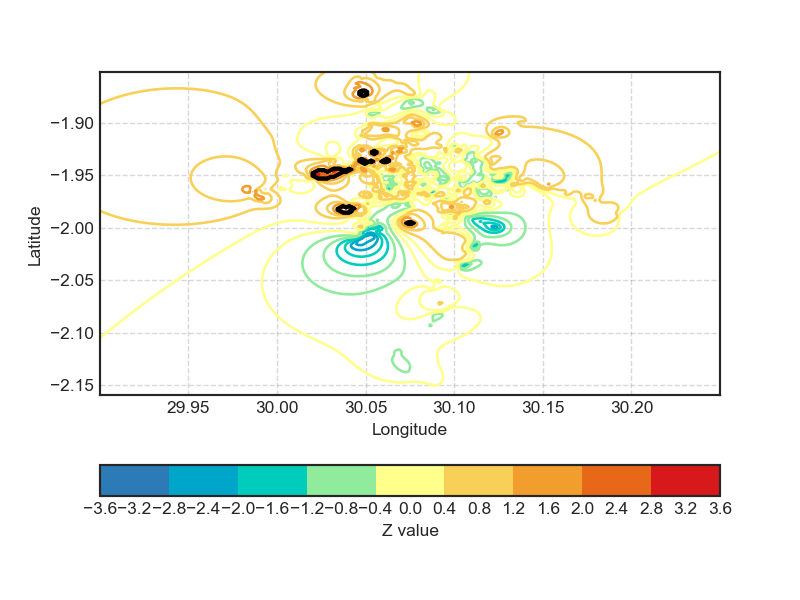

In [17]:
# Plot 06:00:00
plot_contours(df = results_per_time_bracket(response = "pm25_detrended_15", grid = 200, bracket = "06:00:00",
                                            dict_mean = mean_values_di, dict_var = var_values_di),
              level = "z_val", sig_level = 0.05)

### 4 Assessment of Predictions

In [9]:
def get_nearest_tile_ID(df: pd.DataFrame, point: tuple):
    """
    Retrieve ID of tile centroid nearest to a (lon, lat) point.
    
    INPUT:
    df: df_cl or df_lp (pd.DataFrame)
    point: (lon, lat)

    OUTPUT:
    ID: corresponds to observation in df closest to point (int)
    """
    # unpack tuples
    lon, lat = point
    
    # find nearest grid point
    lon_nearest = df.iloc[(df['lon']-lon).abs().argsort()[:1]]['lon'].tolist()
    lat_nearest = df.iloc[(df['lat']-lat).abs().argsort()[:1]]['lat'].tolist()

    lon_nearest, lat_nearest = *lon_nearest, *lat_nearest

    # get its ID
    tile_id = df[(df['lon'] == lon_nearest) & (df['lat'] == lat_nearest)].index.tolist()

    return tile_id[0]

In [7]:
def combine_results(df: pd.DataFrame, df_final:pd.DataFrame, atg: pd.DataFrame):
    """
    Combine results into a single dataframe with tile_id, PM2.5 and predicted Z value for all sampled tiles.

    Inputs:
    df: df_cl or df_lp
    df_final: predicted values, variances and z values
    atg: atg_cl_gamma or atg_lp_gamma

    Outputs:
    df_combined: dataframe with PM2.5 percentiles & predicted Z values
    """
    # compute tile_IDs
    df_final['tile_id'] = df_final.apply(lambda row: get_nearest_tile_ID(df=df, point=(row['lon'], row['lat'])), axis=1)
    print("Got tile IDs!")

    # filter raster to sampled tiles
    sampled_tiles = atg['tile_id'].unique()
    df_final['tile_sampled'] = df_final['tile_id'].isin(sampled_tiles).astype(int)

    # merge with Z values
    df_combined = df.merge(df_final[['tile_id','predicted_value','predicted_variance','z_val', 'tile_sampled']], how='left', on='tile_id')

    # compute percentile of PM2.5, among sampled tiles only
    df_combined['pm25_percentile'] =  df_combined.apply(\
        lambda x: sps.percentileofscore(df_combined.loc[df_combined['tile_sampled'] == 1,'pm25'], x['pm25']) if x['tile_sampled'] == 1 else np.NaN
        , axis=1
        )

    # get number of times tile sampled
    vc = atg['tile_id'].value_counts()
    df_combined = df_combined.merge(vc,how='left', left_on='tile_id', right_index=True).rename({'count':'tile_sample_count'}, axis=1)

    # count proportion of gamma attacks
    gamma_attacks = atg.groupby('tile_id')['gamma_noise'].sum()
    df_combined = df_combined.merge(gamma_attacks, how='left', left_on='tile_id', right_index=True).rename({'gamma_noise':'gamma_attacks'}, axis=1)
    df_combined['proportion_gamma_attacks'] = df_combined['gamma_attacks'] / df_combined['tile_sample_count']

    return df_combined

In [7]:
def get_hotspots_by_percentile(df_combined, alpha=0.95, n_percentiles=10):
    """
    Compute proportion of points classified as hotspots per PM2.5 percentile.

    Inputs:
    df_combined: output from combine_results()
    alpha: quantile of Gaussian distribution for hotspot classification
    n_percentiles: # percentiles (e.g., 5 = quintiles)

    Outputs:
    hotspots_by_decile: hotspot classification by percentile
    """
    # get critical value from N(0,1) CDF
    crit_val = sps.norm.ppf(alpha)

    # group by decile
    df_combined['pm25_decile'] = pd.qcut(df_combined['pm25_percentile'], n_percentiles, labels=False)
    hotspots_by_percentile = df_combined.groupby('pm25_decile')['z_val'].apply(lambda x: (x > crit_val).mean() * 100)

    df_combined.drop(['pm25_decile'], axis=1,inplace=True)

    return hotspots_by_percentile

In [8]:
def plot_PM25_hist(df_combined, n_bins=20, n_percentiles=20):
    """
    Plots a histogram of PM2.5 measurements in sampled tiles.

    Input:
    df_combined: output of combine_results()
    n_bins: # bins in histogram
    n_percentiles: # percentiles at which to draw vertical lines (e.g., 20 = quintiles)

    Output:
    plots histogram with PM2.5 deciles
    """
    percentiles = np.percentile(df_combined['pm25'], np.linspace(0,100,n_percentiles,endpoint=False))

    # Plot vertical lines at deciles
    for p in percentiles:
        plt.axvline(p, color='red', linestyle='--')
        
    plt.hist(df_combined['pm25'], bins=n_bins, color='blue', alpha=0.7)
    plt.title('PM2.5 Measurement by Tile')
    plt.xlabel('PM2.5 in tile')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

In [16]:
def plot_WHO(df_combined: pd.DataFrame, alpha: float=0.95):
    """
    Plot the proportion of tiles considered hotspots at every integer of PM2.5.

    INPUTS:
    df_combined: output from combine_results()
    atg: one of atg_cl_gamma or atg_lp_gamma
    alpha: critical threshold for determining a significant hotspot
    """

    # only sampled tiles
    df_combined = df_combined[df_combined['tile_sampled'] == 1]

    # round PM2.5 down to nearest 0.2
    df_combined['pm25_rounded'] = (df_combined['pm25'] // 1) * 1

    # count the number of significant points
    crit_val = sps.norm.ppf(alpha)
    proportion_above_crit_val = df_combined.groupby('pm25_rounded')['z_val'].apply(lambda z: (z > crit_val).mean())

    # get overall median PM2.5 (within CL or LP region)
    median_pm25 = np.median(df_combined['pm25'])

    # try overlay empirical CDF
    pm25_sorted = df_combined['pm25_rounded'].sort_values()
    cdf_values = np.arange(1, len(pm25_sorted) + 1) / len(pm25_sorted)

    # Plot empirical CDF
    plt.plot(pm25_sorted, cdf_values, color='red', label='Empirical CDF of PM2.5')

    # plot hotspot classification profile
    plt.plot(proportion_above_crit_val.index, proportion_above_crit_val.values, label=f"Proportion of hotspots at α={alpha}")
    plt.xlabel('PM2.5 (rounded down to nearest int)')
    plt.xticks(proportion_above_crit_val.index)
    plt.ylabel('Proprtion')
    plt.title(f'Proportion of points classified hotspots at α={alpha}')
    plt.grid(True)

    # add overall median line and median + 5
    plt.axvline(x=median_pm25, color='black', linestyle='--', label='Vertical line at x= median PM2.5')
    plt.axvline(x=median_pm25 + 5, color='grey', linestyle='--', label='Vertical line at x= median PM2.5 + 5')

    for pm25, count in df_combined['pm25_rounded'].value_counts().items():
        random_offset = np.random.uniform(-0.05, 0.125) if pm25 < 16 else 0
        plt.text(pm25, proportion_above_crit_val[pm25] + random_offset , f'n={count}', verticalalignment='top', horizontalalignment='center', fontsize=8)

    # Add legend
    plt.legend(fontsize='small',loc='upper left')

    plt.show()

In [24]:
def assess_gamma_attacks(df_combined: pd.DataFrame):
    """
    Assess how the proportion of observations subject to Gamma attacks affects the accuracy of a tile.
    """
    results = dict()

    # filter dataframe to sampled tiles
    df_combined = df_combined[df_combined['tile_sampled'] == 1]

    # compute rank correlations
    for i in range(0,10):

        # lower and upper bounds on gamma proportion
        lb, ub = i * 0.02, (i+1) * 0.02

        # filter df
        df_range = df_combined[(df_combined['proportion_gamma_attacks'] >= lb) & (df_combined['proportion_gamma_attacks'] < ub)]

        # compute correlation and number of obs
        n_obs = len(df_range)
        corr, p_value = sps.spearmanr(df_range['z_val'], df_range['pm25'])
        corr = round(corr, 3)

        # save
        results[(lb, ub)] = (n_obs, corr)

    return results

In [32]:
def plot_gamma_assessment(results: dict, color='gold'):
    """
    Plot how the Spearman rank correlation between PM2.5 and Z values changes with the proportion of Gamma attacks.

    INPUTS:
    results: output from assess_gamma_attacks
    """

    lower_bounds = [key[0] for key in results.keys()]
    correlations = [value[1] for value in results.values()]
    labels = [f"n={value[0]}" for value in results.values()]

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(lower_bounds, correlations, marker='o', linestyle='-', color=color, linewidth=3)
    plt.xlabel('Proportion of gamma attacks')
    plt.ylabel('Correlation')
    plt.title('Spearman rank correlation between estimated Z values and PM2.5')
    plt.grid(True)

    for i, label in enumerate(labels):
        plt.annotate(label, (lower_bounds[i], correlations[i]), textcoords="offset points", xytext=(0,10), ha='center')

    plt.show()

I think this explains somewhat why the hotspot detection is so low. The distribution is very concentrated around the mode. Even the 90'th percentile is only a few points higher than the median.

In [9]:
def get_jaccard_scores(df_combined, quantiles=[0.5,0.75,0.9,0.95,0.99]):
    """
    Compute the Jaccard score for the tiles with highest PM2.5 value.

    Inputs:
    df_combined: output of combine_results()
    quantiles: consider PM2.5 values above this quantile (only >= 0.5 should be relevant)

    Outputs: 
    jaccard_scores: dict |A ∩ B|/|A U B|, where A = top PM2.5, B = top z scores
    """
    jaccard_scores = []

    for q in quantiles:

        # get top quantile
        q_pm25 = df_combined['pm25'].quantile(q)
        q_z_val = df_combined['z_val'].quantile(q)

        # binary series: is row in top quantile?
        pm25_binary = df_combined['pm25'] >= q_pm25
        predicted_value_binary = df_combined['predicted_value'] >= q_z_val

        # compute Jaccard index
        score = jaccard_score(pm25_binary, predicted_value_binary)
        jaccard_scores.append(score)

    return dict((q,round(s,3)) for q,s in zip(quantiles,jaccard_scores))

In [10]:
def save_results(folder, df_gp, final_raster_pm25, description, df_final, models_di, mean_values_di, var_values_di):
    """
    Save results about a modelling attempt, including data, plots and accuracy metrics.
    
    Inputs:
    folder: name of folder, to append to working directory
    df_gp: preprocessed data: the input to the Gaussian process fitting
    final_raster_pm25: the true PM2.5 surface over London
    description: string describing the results
    df_final: output from fitting_process()
    models_di: output from fitting_process()
    mean_values_di: output from fitting_process()
    var_values_di: output from fitting_process()
    """
    # create folder
    cd = os.getcwd()
    folder_path = os.path.join(cd, folder)
    
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
        
    # save heatmap of predictions
    map_obj = plot_zvalues_or_predictions(df_final, level = "z_val")
    map_obj.save(folder + r'\map_output.html')

    # combine results
    df_combined = combine_results(df_gp, final_raster_pm25, df_final)

    # get accuracy scores
    hotspots_by_decile = get_hotspots_by_percentile(df_combined, n_percentiles=10)
    hotspots_by_vigintile = get_hotspots_by_percentile(df_combined, n_percentiles=20)
    hotspots_by_percentile = get_hotspots_by_percentile(df_combined, n_percentiles=100)
    jaccard_scores = get_jaccard_scores(df_combined)

    # save results
    with open(folder + r'\README.txt', 'w') as f:
        f.write(description)
    
    results_dict = {
        'df_combined': df_combined
        , 'hotspots_by_decile':hotspots_by_decile
        , 'hotspots_by_vigintile':hotspots_by_vigintile
        , 'hotspots_by_percentile':hotspots_by_percentile
        , 'jaccard_scores':jaccard_scores
        , 'models_di':models_di
        , 'mean_values_di':mean_values_di
        , 'var_values_di':var_values_di
    }

    with open(folder + r'\results.pkl', 'wb') as f:
        pickle.dump(results_dict, f)

    df_final.to_csv(folder + r'\df_final.csv',index=False)

### 5) Evaluating Beijing fit

In [10]:
df_cl = pd.read_csv("df_cl.csv")
df_lp = pd.read_csv("df_lp.csv")

atg_cl_gamma = pd.read_csv("atg_cl_gamma.csv")
atg_lp_gamma = pd.read_csv("atg_lp_gamma.csv")

df_final_cl = pd.read_csv("df_final_cl.csv")
df_final_lp = pd.read_csv("df_final_lp.csv")

df_combined_cl = combine_results(df_cl, df_final_cl, atg_cl_gamma)
df_combined_lp = combine_results(df_lp, df_final_lp, atg_lp_gamma)

Got tile IDs!
Got tile IDs!


In [11]:
df_combined_cl.head()

,tile_id,lon,lat,pm25,x,y,predicted_value,predicted_variance,z_val,tile_sampled,pm25_percentile,tile_sample_count,gamma_attacks,proportion_gamma_attacks
0,0,116.4040,39.9131,38.786265,449061.023067,4.418282e+06,1.041246,4.889940,0.460861,0,NaN,NaN,NaN,NaN
1,1,116.4043,39.9131,38.786265,449086.663657,4.418282e+06,1.052833,4.860378,0.467516,0,NaN,NaN,NaN,NaN
2,2,116.4046,39.9131,38.786265,449112.304247,4.418282e+06,1.064472,4.830311,0.474265,0,NaN,NaN,NaN,NaN
3,3,116.4048,39.9131,38.786265,449129.397974,4.418282e+06,1.072262,4.810030,0.478816,0,NaN,NaN,NaN,NaN
4,4,116.4051,39.9131,38.786265,449155.038563,4.418282e+06,1.083988,4.779305,0.485716,0,NaN,NaN,NaN,NaN


In [51]:
np.max(df_combined_cl_gamma['gamma_attacks'] / df_combined_cl_gamma['tile_sample_count'])

0.5

(array([6.150e+02, 5.340e+02, 2.063e+03, 1.908e+03, 4.720e+02, 2.040e+02,
        1.120e+02, 4.600e+01, 4.000e+01, 9.000e+00, 2.600e+01, 4.000e+00,
        1.400e+01, 7.000e+00, 0.000e+00, 7.000e+00, 0.000e+00, 3.000e+00,
        0.000e+00, 0.000e+00, 5.000e+00, 0.000e+00, 1.000e+00, 0.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([0.        , 0.01666667, 0.03333333, 0.05      , 0.06666667,
        0.08333333, 0.1       , 0.11666667, 0.13333333, 0.15      ,
        0.16666667, 0.18333333, 0.2       , 0.21666667, 0.23333333,
        0.25      , 0.26666667, 0.28333333, 0.3       , 0.31666667,
        0.33333333, 0.35      , 0.36666667, 0.38333333, 0.4       ,
        0.41666667, 0.43333333, 0.45      , 0.46666667, 0.48333333,
        0.5       ]),
 <BarContainer object of 30 artists>)

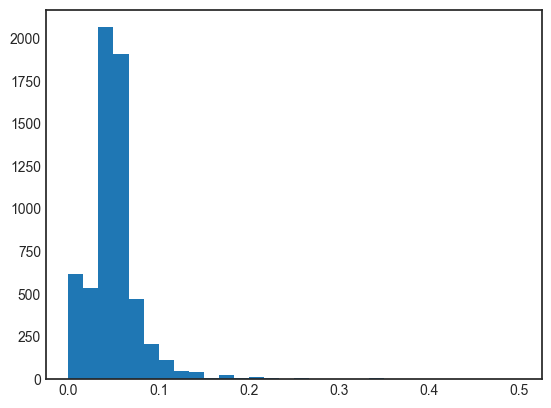

In [14]:
plt.hist(df_combined_cl['proportion_gamma_attacks'], bins=30)

C:\Users\nial\AppData\Local\Temp\ipykernel_6676\4006747192.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_combined['pm25_rounded'] = (df_combined['pm25'] // 1) * 1


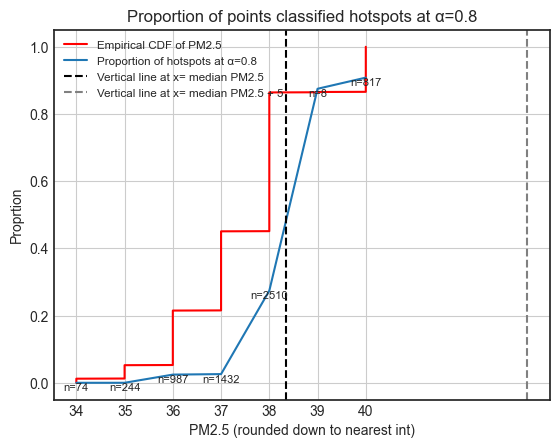

In [ ]:
plot_WHO(df_combined_cl, alpha=0.80)

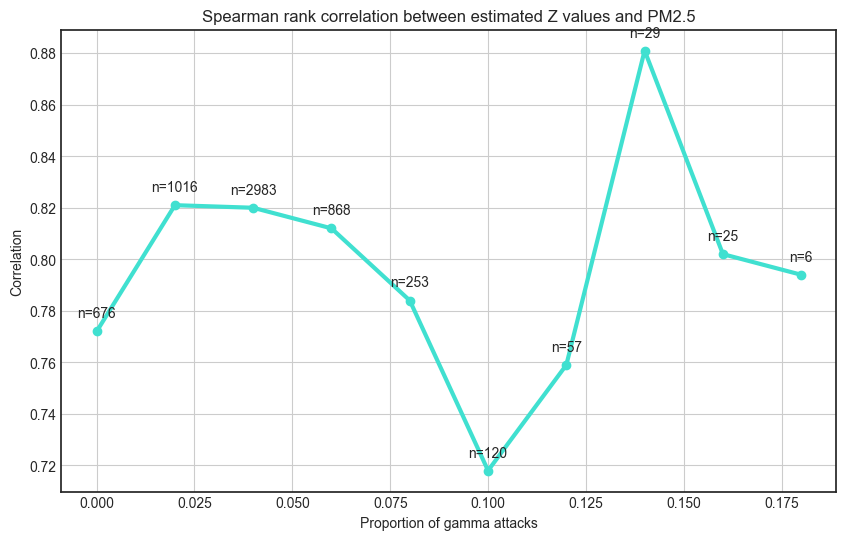

In [33]:
gamma_results_cl = assess_gamma_attacks(df_combined_cl)
plot_gamma_assessment(gamma_results_cl, color="turquoise")

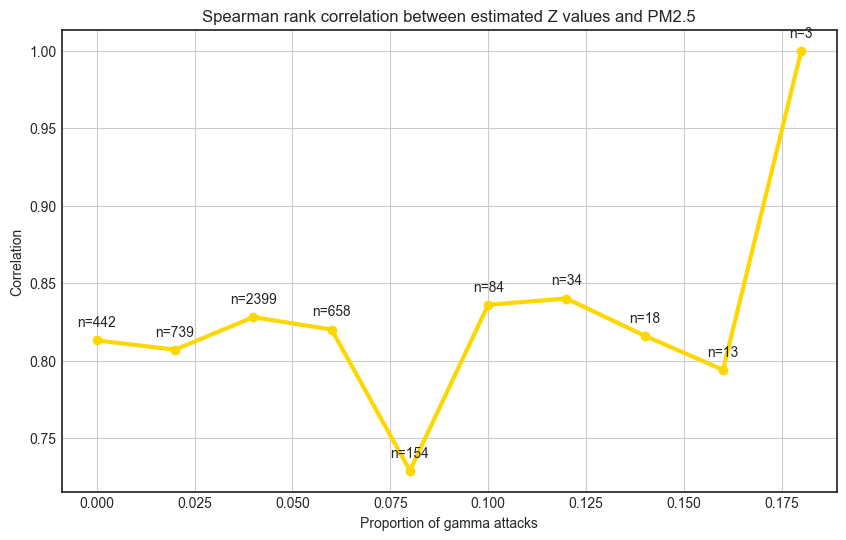

In [34]:
gamma_results_lp = assess_gamma_attacks(df_combined_lp)
plot_gamma_assessment(gamma_results_lp)

In [ ]:
max(df_combined_cl['pm25'] - np.median(df_combined_cl['pm25']))

2.864004999999999

In [ ]:
sum(df_combined_lp['z_val'] > sps.norm.ppf(0.95))

3377

In [ ]:
sum(df_combined_lp['z_val'] > sps.norm.ppf(0.95)) / len(df_combined_lp)

0.2269489247311828

In [ ]:
sum((df_combined_lp['z_val'] > sps.norm.ppf(0.95)) & (df_combined_lp['tile_sampled'] == 1)) / sum(df_combined_lp['tile_sampled'] == 1)

0.22825848849945235

In [ ]:
sum((df_combined_lp['z_val'] > sps.norm.ppf(0.95)) & (df_combined_lp['tile_sampled'] == 1))

1042

#### Example: save results from a model run

In [3]:
# Path to data
path = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI"
os.chdir(path)

# these do not change with model runs
df_gp = pd.read_csv("df_gp.csv")
final_raster_pm25 = pd.read_csv(r"Final_Raster_PM2.5.csv")

# outputs of fitting_process(); just loading here to test
df_final = pd.read_csv("df_final.csv")

with open("mean_dict_2hours.pkl", "rb") as file:
    mean_values_di = pickle.load(file)

with open("var_dict_2hours.pkl", "rb") as file:
    var_values_di = pickle.load(file)

with open("models_dict_2hours.pkl", "rb") as file:
    models_di = pickle.load(file)

# customise
folder = path + r"\results_attempt_2"

description = '''

Date: 25/04/2024

Description:
Second attempt at fitting process. Implemented weighted bagging in the Gaussian Process fit. 

Call:
models_di, mean_values_di, var_values_di, df_final = fitting_process(response = "pm25_detrended_15", iterations = 100,
                                                                     p_low = 20, p_high = 80,
                                                                     sample_frac_low = 0.3, sample_frac_high = 0.3,
                                                                     sample_frac_medium = 0.4, add_covariates = False,
                                                                     size_subsample = 2000, grid = 200, independence = False
                                                                     , weighted_fit=True)

'''

In [13]:
save_results(folder, df_gp, final_raster_pm25, description, df_final, models_di, mean_values_di, var_values_di)

100%|██████████| 20383/20383 [00:04<00:00, 4890.92it/s]
C:\Users\nial\AppData\Local\Temp\ipykernel_23016\412153969.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final['tile_id'] = df_final.progress_apply(lambda row: get_nearest_tile_ID(bbox, period, (row['x'], row['y']), final_raster_pm25), axis=1)


#### Examine results with modified procedure

In [2]:
path = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI"
folder = path + r"\results_attempt_1"

with open(folder + r'\results.pkl', 'rb') as f:
    results_dict_1 = pickle.load(f)

In [23]:
path = r"C:\Users\nial\OneDrive\ETH Zürich\Statslab 2024\LAEI"
folder = path + r"\results_attempt_2"

with open(folder + r'\results.pkl', 'rb') as f:
    results_dict_2 = pickle.load(f)

#### 4.1: WHO Hotspot Definition

The WHO classifies hotspots as areas where the average PM2.5 pollution is 5μg / $m^3$ above the median level. Using this definition, let's investigate how many 'true hotspot' points are identified as such.

We can replicate the above plots, too

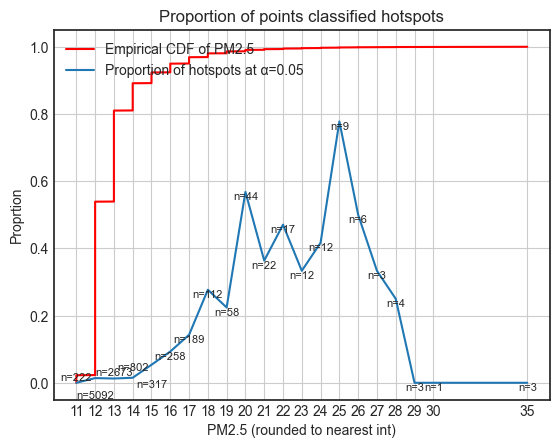

#### Miscellaneous Code

Examine highest z-values among unsampled tiles

In [37]:
df_combined.loc[df_combined['tile_sampled'] == 0, 'z_val'].quantile([0.01 * x for x in range(90,100)])

0.90    11.750939
0.91    12.236453
0.92    12.882808
0.93    13.505585
0.94    14.191354
0.95    15.071349
0.96    16.041211
0.97    17.365459
0.98    18.926185
0.99    21.959545
Name: z_val, dtype: float64